In [1]:
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%config InlineBackend.figure_format='retina'

In [2]:
def plot_van_krevelen(df,s_scaler=1e6):
    # Calculate O/C and H/C ratios
    df['O/C'] = df['O'] / df['C']
    df['H/C'] = df['H'] / df['C']
    
    # Create the scatter plot
    plt.figure(figsize=(10, 6))
    plt.scatter(df['H/C'], df['O/C'], c=df['AI'], cmap='viridis', s=s_scaler*df['abundance'], alpha=0.7, edgecolors='w')
    plt.colorbar(label='Peak Abundance')
    
    # Add labels and title
    plt.xlabel('H/C')
    plt.ylabel('O/C')
    plt.title('Van-Krevelen Diagram')
    plt.grid(True)
    
    # Show the plot
    plt.show()


In [3]:
def calculate_indices_bundled_v4(df: pd.DataFrame) -> pd.DataFrame:
    """
    Further modified consolidated function to handle rows with 'tag' as None and handle None values in DBE and C.
    """
    
    # CRAM function logic
    def cram_check(row):
        if pd.isnull(row['tag']) or row['tag'] != 'Unambiguous':
            return None
        if pd.isnull(row['C']) or pd.isnull(row['DBE']):
            return None
        if row['DBE']/row['C'] < 0.3 or row['DBE']/row['C'] > 0.68:
            return False
        if row['DBE']/row['H'] < 0.2 or row['DBE']/row['H'] > 0.95:
            return False
        if row['O'] == 0:
            return False
        elif row['DBE']/row['O'] < 0.77 or row['DBE']/row['O'] > 1.75:
            return False
        return True
    
    df['CRAM'] = df.apply(cram_check, axis=1)
    
    # NOSC function logic
    df['NOSC'] = np.where(df['tag'] == 'Unambiguous', 
                          4.0 - (df["C"] * 4 + df["H"] - df['O'] * 2 - df['N'] * 3 - df['S'] * 2) / df['C'], 
                          None)
    
    # CAI function logic
    df['CAI'] = np.where(df['tag'] == 'Unambiguous', 
                         df["C"] - df["O"] - df["N"] - df["S"] - df["P"], 
                         None)
    
    # DBE_AI function logic
    df['DBE_AI'] = np.where(df['tag'] == 'Unambiguous', 
                            1.0 + df["C"] - df["O"] - df["S"] - 0.5 * (df["H"] + df['N'] + df["P"]), 
                            None)
    
    # AI function logic
    def calculate_AI(row):
        if row['tag'] == 'Unambiguous':
            if row['DBE_AI']<=0 or row['CAI']<=0:
                return 0
            else:

                return row["DBE_AI"] / row["CAI"]
        else:
            return None
    df["AI"] = df.apply(calculate_AI, axis=1)
    df = calculate_full_indices_corrected(df)
    def calculate_log10C0(row):
        if row['group'] == 'CHO':
            n_0C= 22.66
            b_C = 0.4481
            b_O = 1.656
            b_CO = -0.7790
            return (n_0C-row['C'])*b_C - row['O']*b_O - b_CO*(2*row['C']*row['O'])/(row['C']+row['O'])
        elif row['group'] == 'CHON':
            n_0C= 24.13
            b_C = 0.3667
            b_O = 0.7732
            b_CO = -0.07790
            b_N = 1.114
            return (n_0C-row['C'])*b_C - row['O']*b_O - b_CO*(2*row['C']*row['O'])/(row['C']+row['O']) - row['N']*b_N
        elif row['group'] == 'CHOS':
            n_0C= 24.06
            b_C = 0.3637
            b_O = 1.327
            b_CO = -0.3988
            b_S = 0.7579
            return (n_0C-row['C'])*b_C - row['O']*b_O - b_CO*(2*row['C']*row['O'])/(row['C']+row['O']) - row['S']*b_S
        else:
            return None
    df['log10C0']=df.apply(calculate_log10C0, axis=1)
    
    
    return df



In [7]:
def calculate_full_indices_corrected(df: pd.DataFrame) -> pd.DataFrame:
    """
    Consolidated function to handle rows with 'tag' as None, handle None values in DBE and C, 
    add abundance-weighted indices, and assign molecular classes.
    """
    
    # Molecular class logic
    def get_zone_kell(row):
        if row['H_C'] >= 1.5:
            if row['O_C'] < 0.3 and row['N'] == 0:
                return 'lipids'
            elif row['N'] >= 1:
                return 'N-satureted'
            else:
                return 'aliphatics'
        elif row['H_C'] < 1.5 and row['AI'] < 0.5:
            if row['O_C'] <= 0.5:
                return 'unsat_lowOC'
            else:
                return 'unsat_highOC'
        elif row['AI'] > 0.5 and row['AI'] <= 0.67:
            if row['O_C'] <= 0.5:
                return 'aromatic_lowOC'
            else:
                return 'aromatic_highOC'
        elif row['AI'] > 0.67:
            if row['O_C'] <= 0.5:
                return 'condensed_lowOC'
            else:
                return 'condensed_highOC'
        else:
            if row['H_C']:
                return 'undefinded'

    def get_zone_perm(row):
        if row['O_C'] < 0.5:
            if row['H_C'] < 1:
                return 'condensed_tanins'
            elif row['H_C'] < 1.4:
                return 'phenylisopropanoids'
            elif row['H_C'] < 1.8:
                return 'terpenoids'
            elif row['H_C'] <= 2.2:
                if row['O_C'] < 0.25:
                    return 'lipids'
                else:
                    return 'proteins'
            else:
                return 'undefinded'
        elif row['O_C'] <= 1:
            if row['H_C'] < 1.4:
                return 'hydrolyzable_tanins'
            elif row['H_C'] <= 2.2:
                return 'carbohydrates'
            else:
                return 'undefinded'
        else:
            return 'undefinded'

    def get_zone_lasz(row):
        if row['H_C'] >= 0.86 and row['H_C'] <=1.34 and row['O_C'] >= 0.21 and row['O_C'] <=0.44:
            return 'lignin'
        elif row['H_C'] >= 0.7 and row['H_C'] <=1.01 and row['O_C'] >= 0.16 and row['O_C'] <=0.84:
            return 'tannin'
        elif row['H_C'] >= 1.33 and row['H_C'] <=1.84 and row['O_C'] >= 0.17 and row['O_C'] <=0.48:
            return 'peptide'
        elif row['H_C'] >= 1.34 and row['H_C'] <=2.18 and row['O_C'] >= 0.01 and row['O_C'] <=0.35:
            return 'lipid'
        elif row['H_C'] >= 1.53 and row['H_C'] <=2.2 and row['O_C'] >= 0.56 and row['O_C'] <=1.23:
            return 'carbohydrate'
        elif row['H_C'] >= 1.62 and row['H_C'] <=2.35 and row['O_C'] >= 0.56 and row['O_C'] <=0.95:
            return 'aminosugar'
        else:
            return 'undefinded'
    
    # Assign molecular classes
    df['class_kell'] = df.apply(get_zone_kell, axis=1)
    df['class_perm'] = df.apply(get_zone_perm, axis=1)
    df['class_lasz'] = df.apply(get_zone_lasz, axis=1)
    
    return df


In [8]:
def abundance_weighted_average_modified(df, column_name,mz=(200,300)):
    """
    Compute the abundance-weighted average for a specific column.
    
    Parameters:
    - df (pd.DataFrame): Dataframe containing 'abundance' and the specified column.
    - column_name (str): The name of the column for which the abundance-weighted average is to be computed.
    
    Returns:
    - float: Abundance-weighted average of the specified column.
    """
    # Filter rows with tag "Unambiguous"
    filtered_df = df[df['tag'] == 'Unambiguous']
    filtered_df = filtered_df[(filtered_df['exp_mass'] >= mz[0]) & (filtered_df['exp_mass'] <= mz[1])]
    # Compute the abundance-weighted average
    #weighted_sum = ( filtered_df['abundance'] * filtered_df[column_name]).sum()
    total_abundance =  filtered_df['abundance'].sum()
    
    # Avoid division by zero
    if total_abundance == 0:
        return 0
    
    return ( filtered_df['abundance'] * filtered_df[column_name]/ total_abundance).sum() 



In [9]:
def cal_index(df,range=(200,1000)):
    weighted_C_mod = abundance_weighted_average_modified(df, 'C',range)
    weighted_H_mod = abundance_weighted_average_modified(df, 'H',range)
    weighted_O_mod = abundance_weighted_average_modified(df, 'O',range)
    weighted_DBE_mod = abundance_weighted_average_modified(df, 'DBE',range)
    weighted_O_C_mod = abundance_weighted_average_modified(df, 'O_C',range)
    weighted_H_C_mod = abundance_weighted_average_modified(df, 'H_C',range)
    #weighted_DBEO_mod = abundance_weighted_average_modified(df, 'DBEO',range)
    #weighted_CRAM_mod = abundance_weighted_average_modified(df, 'CRAM',range)
    weighted_AI_mod = abundance_weighted_average_modified(df, 'AI',range)
    weighted_NOSC_mod = abundance_weighted_average_modified(df, 'NOSC',range)
    print(weighted_C_mod,'C')
    print(weighted_H_mod ,'H')
    print(weighted_O_mod ,"O")
    print(weighted_DBE_mod ,"DBE")
    print(weighted_O_C_mod,'O/C')
    print(weighted_H_C_mod,'H/C')
    print(weighted_AI_mod,'AI')
    print(weighted_NOSC_mod,'NOSC')

In [10]:
import pandas as pd 
import numpy as np
def combine_mfa_file(assign_path,unassign_path,):
    assign_df = pd.read_csv(assign_path)
    unassign_df = pd.read_csv(unassign_path)

    unassigned = unassign_df.rename(columns={"Unnamed: 0": "ID"})
    formulas = assign_df.rename(columns={"Unnamed: 0": "ID"})

# Add missing columns from the formulas dataframe to the unassigned dataframe
    for column in formulas.columns:
        if column not in unassigned.columns:
            unassigned[column] = None
    final_df = pd.concat([unassigned, formulas], ignore_index=True)
    final_df.drop(['ID'],axis=1,inplace=True)
    final_df.rename(columns={"RT": "SN"},inplace=True)
    #final_df['abundance'] = final_df['abundance']/final_df['abundance'].sum()
    #final_df = final_df[final_df['abundance']>= 0.1*final_df['abundance'].max()]
    #final_df = final_df[final_df['AE_ppm']<=0.5]
    #final_df = final_df[final_df['DBEO']<10]

    #final_df = final_df[final_df['exp_mass']<600]
    final_df = calculate_indices_bundled_v4(final_df)
    return final_df


In [11]:
def abundance_weighted_mass_average(df, mass_range=(200, 1000)):
    """
    Compute the abundance-weighted mass average for the dataframe.
    
    Parameters:
    - df (pd.DataFrame): Dataframe containing 'exp_mass' and 'abundance' columns.
    - mass_range (tuple): A tuple defining the lower and upper bounds for mass. Defaults to all masses.
    
    Returns:
    - float: Abundance-weighted mass average.
    """
    # Filter rows based on the provided mass range
    filtered_df = df[(df['exp_mass'] >= mass_range[0]) & (df['exp_mass'] <= mass_range[1])]
    
    weighted_sum = (filtered_df['exp_mass'] * filtered_df['abundance']).sum()
    total_abundance = filtered_df['abundance'].sum()
    
    # Avoid division by zero
    if total_abundance == 0:
        return 0
    
    return weighted_sum / total_abundance

In [12]:
Path_SRFA = 'R_Assign/SRFA_Best/SRFA/SRFA_3_Unambiguous_Formulas.csv'
Path_SRFA_un = 'R_Assign/SRFA_Best/SRFA/SRFA_3_Unassigned_Masses.csv'

#SRFA = combine_mfa_file(Path_SRFA,Path_SRFA_un)
SRFA = pd.read_csv(Path_SRFA)
#SRFA['abundance'] = SRFA['abundance']/SRFA['abundance'].max() 
SRFA = calculate_indices_bundled_v4(SRFA)
Path_SRFA_300 = 'R_Assign/SRFA_Best/300/SRFA_300_1_Unambiguous_Formulas.csv'
Path_SRFA_300_un = 'R_Assign/SRFA_Best/300/SRFA_300_1_Unassigned_Masses.csv'

#SRFA_300 = combine_mfa_file(Path_SRFA_300,Path_SRFA_300_un)
SRFA_300 = pd.read_csv(Path_SRFA_300)
#SRFA_300['abundance'] = SRFA_300['abundance']/SRFA_300['abundance'].max() 

SRFA_300 = calculate_indices_bundled_v4(SRFA_300)

Path_SRFA_350 = 'R_Assign/SRFA_Best/350/SRFA_350_3_Unambiguous_Formulas.csv'
Path_SRFA_350_un = 'R_Assign/SRFA_Best/350/SRFA_350_3_Unassigned_Masses.csv'

#SRFA_350 = combine_mfa_file(Path_SRFA_350,Path_SRFA_350_un)
SRFA_350 = pd.read_csv(Path_SRFA_350)

#SRFA_350['abundance'] = SRFA_350['abundance']/SRFA_350['abundance'].max() 

SRFA_350 = calculate_indices_bundled_v4(SRFA_350)


SRFA = SRFA[(SRFA['theor_mass']>=200) & (SRFA['theor_mass']<=800)]
SRFA_350 = SRFA_350[(SRFA_350['theor_mass']>=200) & (SRFA_350['theor_mass']<=800)]
SRFA_300 = SRFA_300[(SRFA_300['theor_mass']>=200) & (SRFA_300['theor_mass']<=800)]
SRFA_list = [SRFA, SRFA_350, SRFA_300]

In [13]:
print(len(SRFA))
print(len(SRFA_350))
print(len(SRFA_300))


2520
2248
2020


In [14]:
print(len(SRFA[SRFA['DBE']/SRFA['C']>=0.5])/len(SRFA))
print(len(SRFA_300[SRFA_300['DBE']/SRFA_300['C']>=0.5])/len(SRFA_300))
print(len(SRFA_350[SRFA_350['DBE']/SRFA_350['C']>=0.5])/len(SRFA_350))



0.5611111111111111
0.5495049504950495
0.5769572953736655


In [15]:
print(SRFA[SRFA['DBE']/SRFA['C']>=0.5]['abundance'].sum()/SRFA['abundance'].sum())
print(SRFA_350[SRFA_350['DBE']/SRFA_350['C']>=0.5]['abundance'].sum()/SRFA_350['abundance'].sum())
print(SRFA_300[SRFA_300['DBE']/SRFA_300['C']>=0.5]['abundance'].sum()/SRFA_300['abundance'].sum())



0.5668854687454278
0.5888489957710069
0.5202448362263616


In [16]:
print(SRFA[SRFA['AI']>=0.5]['abundance'].sum()/SRFA['abundance'].sum())
print(SRFA_350[SRFA_350['AI']>=0.5]['abundance'].sum()/SRFA_350['abundance'].sum())
print(SRFA_300[SRFA_300['AI']>=0.5]['abundance'].sum()/SRFA_300['abundance'].sum())

0.0073510297651648545
0.0037986118797652944
0.003461780348302243


In [17]:
cal_index(SRFA,(100,800))
print('/n')
cal_index(SRFA_350,(100,800))
print('/n')
cal_index(SRFA_300,(100,800))


23.573157313800078 C
24.86174609165378 H
12.29684892602289 O
12.14241180745985 DBE
0.5310199943321413 O/C
1.0554793897905934 H/C
0.07547387230011463 AI
0.006594609403465699 NOSC
/n
23.852841378642893 C
24.85219582366559 H
13.153091667893996 O
12.426743466810091 DBE
0.5601822896389237 O/C
1.041702816152597 H/C
0.056682885540423666 AI
0.07866176312525067 NOSC
/n
23.17733381076453 C
25.055050007530095 H
12.119377963501451 O
11.649808806999483 DBE
0.532027941842732 O/C
1.0813514910272968 H/C
0.06146595082670945 AI
-0.017295607341832744 NOSC


In [18]:
SRFA_set = set(SRFA['formula'])
SRFA_350_set = set(SRFA_350['formula'])
SRFA_300_set = set(SRFA_300['formula'])


In [19]:
print(len(SRFA_set),len(SRFA_350),len(SRFA_300))

2520 2248 2020


In [20]:
print(len(SRFA_set - SRFA_300_set))
print(len(SRFA_300_set - SRFA_set))


635
135


In [21]:
print(len(SRFA_set - SRFA_350_set))
print(len(SRFA_350_set - SRFA_set))

534
262


Text(0, 0.5, 'Abundance (A.U.)')

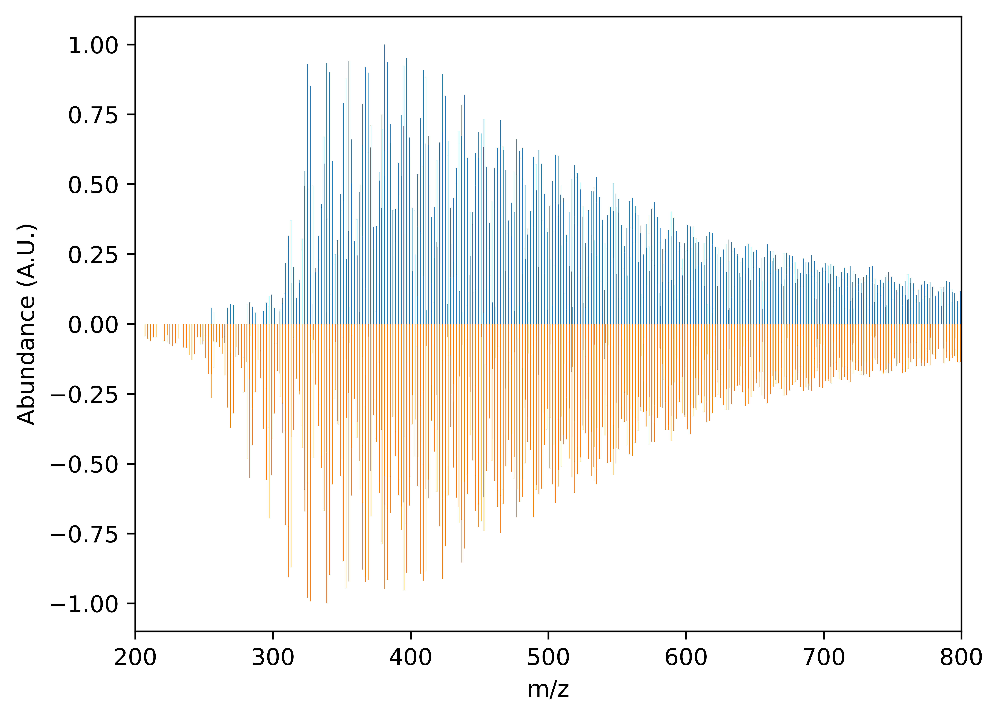

In [19]:
plt.bar(SRFA_350['theor_mass'],SRFA_350['abundance'],width=0.5)

#plt.bar(SRFA_350['theor_mass'],SRFA_350['abundance']/SRFA_350['abundance'].max())
plt.bar(SRFA['theor_mass'],-SRFA['abundance'],width=0.5,)
plt.xlim((200,800))
plt.xlabel('m/z')
plt.ylabel('Abundance (A.U.)')


In [20]:
cal_index(SRFA,(100,800))

23.57315731380008 C
24.861746091653785 H
12.29684892602289 O
12.142411807459853 DBE
0.5310199943321413 O/C
1.0554793897905934 H/C
0.07547387230011463 AI
0.00659460940346569 NOSC


In [21]:
cal_index(SRFA_300,(100,800))

23.177333810764523 C
25.055050007530085 H
12.119377963501448 O
11.649808806999479 DBE
0.5320279418427318 O/C
1.0813514910272966 H/C
0.061465950826709435 AI
-0.01729560734183274 NOSC


In [22]:
cal_index(SRFA_350,(100,800))

23.852841378642882 C
24.85219582366559 H
13.153091667893994 O
12.426743466810091 DBE
0.5601822896389236 O/C
1.0417028161525967 H/C
0.05668288554042366 AI
0.07866176312525064 NOSC


In [22]:
LDI_SRFA_path = 'data_1/csv/SRFA/LDI_MS892_SRFA_1.d.csv'
LDI_300_SRFA_path = 'data_1/csv/SRFA_300nm_12h/LDI_MS396_redo-1.d.csv'
LDI_350_SRFA_path = 'data_1/csv/SRFA_350nm_12h/LDI_MS954_1.d.csv'

LDI_SRFA = pd.read_csv(LDI_SRFA_path)
LDI_300_SRFA = pd.read_csv(LDI_300_SRFA_path)
LDI_350_SRFA = pd.read_csv(LDI_350_SRFA_path)
cut_off = 3e5
LDI_SRFA = LDI_SRFA[LDI_SRFA['i']>cut_off]
LDI_300_SRFA = LDI_300_SRFA[LDI_300_SRFA['i']>cut_off]
LDI_350_SRFA = LDI_350_SRFA[LDI_350_SRFA['i']>cut_off]



<BarContainer object of 3198 artists>

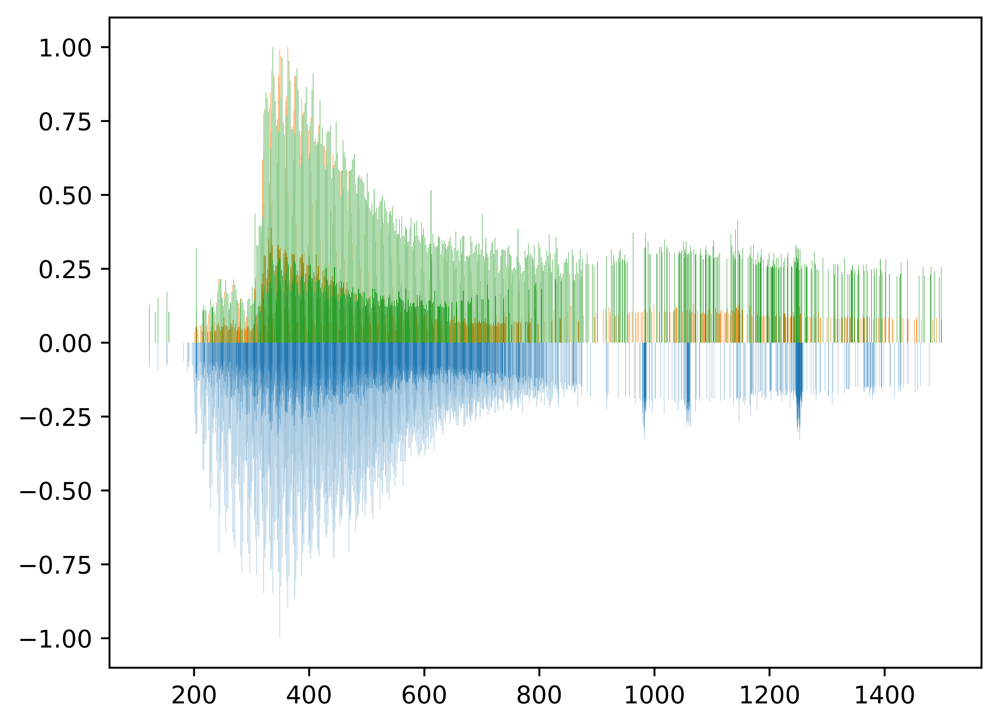

In [49]:
plt.bar(LDI_SRFA['mz'], -LDI_SRFA['i']/LDI_SRFA['i'].max(),label='Fresh',alpha=0.5)
plt.bar(LDI_300_SRFA['mz'], LDI_300_SRFA['i']/LDI_300_SRFA['i'].max(),label='300nm')
plt.bar(LDI_350_SRFA['mz'], LDI_350_SRFA['i']/LDI_350_SRFA['i'].max(),label='350nm')

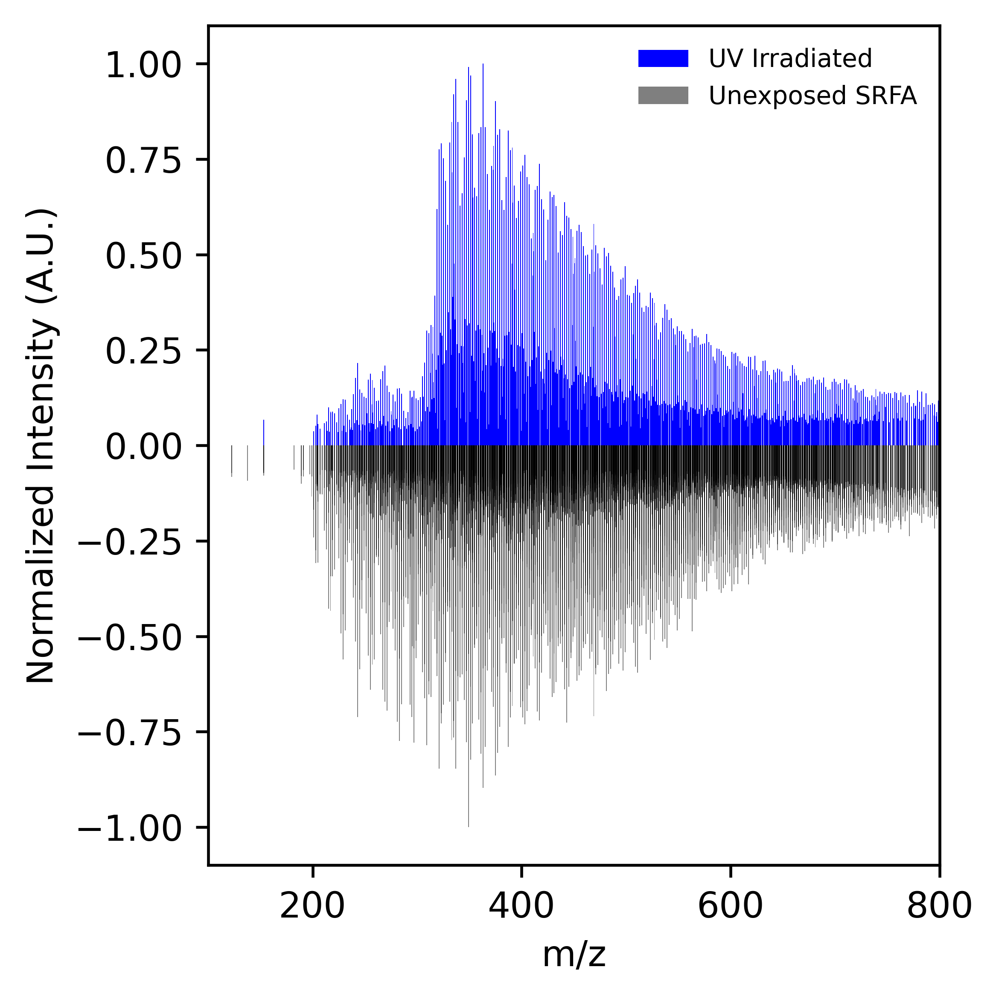

In [27]:
fig, ax = plt.subplots(1, 1, figsize=(4, 4),sharey=True) 
ax.bar(LDI_300_SRFA['mz'], LDI_300_SRFA['i']/LDI_300_SRFA['i'].max(),label='UV Irradiated',color='blue')
ax.bar(LDI_SRFA['mz'], -LDI_SRFA['i']/LDI_SRFA['i'].max(),label='Unexposed SRFA',alpha=0.5,color='black')
ax.set_ylabel('Normalized Intensity (A.U.)')
#ax[1].bar(LDI_350_SRFA['mz'], LDI_350_SRFA['i']/LDI_350_SRFA['i'].max(),label='UVA Irradiated',color='red')
#ax[1].bar(LDI_SRFA['mz'], -LDI_SRFA['i']/LDI_SRFA['i'].max(),label='Unexposed SRFA',alpha=0.5,color='black')

ax.set_xlim((100,800))
ax.set_xlabel('m/z')
ax.legend(frameon=False,fontsize=7) 
plt.tight_layout()

In [23]:
####SRFA_Aqu
Path_SRFA_0h_1 = 'R_Assign/SRFA_Aqu_300/0h/SRFA_Aqu_0m_1_Unambiguous_Formulas.csv'
Path_SRFA_0h_2 = 'R_Assign/SRFA_Aqu_300/0h/SRFA_Aqu_0m_2_Unambiguous_Formulas.csv'
Path_SRFA_0h_3= 'R_Assign/SRFA_Aqu_300/0h/SRFA_Aqu_0m_3_Unambiguous_Formulas.csv'
Path_SRFA_0h_4 = 'R_Assign/SRFA_Aqu_300/0h/SRFA_Aqu_0m_4_Unambiguous_Formulas.csv'
path_SRFA_list  =[Path_SRFA_0h_1 ,Path_SRFA_0h_2 ,Path_SRFA_0h_3 ,Path_SRFA_0h_4 ]
#fig, ax = plt.subplots(4, 1, figsize=(12, 6),sharex=True) 
#for i,a in enumerate(ax):
#    df = pd.read_csv(path_SRFA_list[i])
#    print(len(df))
#    a.bar(df['theor_mass'],df['abundance'])
####SRFA_0h_3 is the best one 

df_SRFA_Aqu_0h = pd.read_csv(path_SRFA_list[2])
df_SRFA_Aqu_0h_un = pd.read_csv('R_Assign/SRFA_Aqu_300/0h/SRFA_Aqu_0m_3_Unassigned_Masses.csv')
####SRFA_Aqu
Path_SRFA_1h_1 = 'R_Assign/SRFA_Aqu_300/1h/SRFA_Aqu_1h_1_Unambiguous_Formulas.csv'
Path_SRFA_1h_2 = 'R_Assign/SRFA_Aqu_300/1h/SRFA_Aqu_1h_2_Unambiguous_Formulas.csv'
Path_SRFA_1h_3= 'R_Assign/SRFA_Aqu_300/1h/SRFA_Aqu_1h_3_Unambiguous_Formulas.csv'
path_SRFA_1h_list  =[Path_SRFA_1h_1 ,Path_SRFA_1h_2 ,Path_SRFA_1h_3  ]
#fig, ax = plt.subplots(3, 1, figsize=(12, 6),sharex=True) 
#for i,a in enumerate(ax):
#    df = pd.read_csv(path_SRFA_1h_list[i])
#    print(len(df))
#    a.bar(df['theor_mass'],df['abundance'])
####SRFA_0h_1 is the best one 
df_SRFA_Aqu_1h = pd.read_csv(path_SRFA_1h_list[0])
df_SRFA_Aqu_1h_un = pd.read_csv('R_Assign/SRFA_Aqu_300/1h/SRFA_Aqu_1h_1_Unassigned_Masses.csv')
####SRFA_Aqu
Path_SRFA_3h_1 = 'R_Assign/SRFA_Aqu_300/3h/SRFA_Aqu_3h_1_Unambiguous_Formulas.csv'
Path_SRFA_3h_2 = 'R_Assign/SRFA_Aqu_300/3h/SRFA_Aqu_3h_2_Unambiguous_Formulas.csv'
Path_SRFA_3h_3= 'R_Assign/SRFA_Aqu_300/3h/SRFA_Aqu_3h_3_Unambiguous_Formulas.csv'
path_SRFA_3h_list  =[Path_SRFA_3h_1 ,Path_SRFA_3h_2 ,Path_SRFA_3h_3  ]
#fig, ax = plt.subplots(3, 1, figsize=(12, 6),sharex=True) 
#for i,a in enumerate(ax):
#    df = pd.read_csv(path_SRFA_3h_list[i])
#    print(len(df))
#    a.bar(df['theor_mass'],df['abundance'])
#####SRFA_3h_1 is the best one 
df_SRFA_Aqu_3h = pd.read_csv(path_SRFA_3h_list[0])
df_SRFA_Aqu_3h_un = pd.read_csv('R_Assign/SRFA_Aqu_300/3h/SRFA_Aqu_3h_1_Unassigned_Masses.csv')
SRFA_300_Aqu_list = [df_SRFA_Aqu_0h,df_SRFA_Aqu_1h,df_SRFA_Aqu_3h]
SRFA_300_Aqu_un_list = [df_SRFA_Aqu_0h_un,df_SRFA_Aqu_1h_un,df_SRFA_Aqu_3h_un]
for item in SRFA_300_Aqu_list:
    print(len(item))
    item=calculate_indices_bundled_v4(item)

2230
2056
2188


In [79]:
for item in SRFA_300_Aqu_list:
    cal_index(item)
    print('/n')

22.400544927148815 C
22.963777593509157 H
11.925973984463141 O
11.918656130394236 DBE
0.538937688109359 O/C
1.0302162807396813 H/C
0.08729932105140482 AI
0.04765909547903688 NOSC
/n
21.54853425463155 C
22.654085659481453 H
11.428569875035123 O
11.221491424890827 DBE
0.5387314043938651 O/C
1.0573273808667847 H/C
0.08218754246893094 AI
0.02013542792094539 NOSC
/n
20.833394492577504 C
22.416017633290714 H
11.289992383900294 O
10.62839136632602 DBE
0.5523671956276079 O/C
1.079621238447991 H/C
0.06836889246204331 AI
0.026246653472701255 NOSC
/n


In [30]:
print(len(set(SRFA_300_Aqu_list[0]['formula'])-set(SRFA_300_Aqu_list[1]['formula'])))
print(len(set(SRFA_300_Aqu_list[0]['formula'])-set(SRFA_300_Aqu_list[2]['formula'])))

281
309


In [32]:
set(SRFA_300_Aqu_list[2]['formula'])-set(SRFA_300_Aqu_list[0]['formula'])
#print(len(set(SRFA_300_Aqu_list[1]['formula'])-set(SRFA_300_Aqu_list[0]['formula'])))


{'C10H10O10',
 'C10H10O4',
 'C10H10O9',
 'C10H12O10',
 'C10H12O4',
 'C10H12O9',
 'C10H14O4',
 'C10H14O8',
 'C10H14O9',
 'C10H16O5',
 'C10H16O6',
 'C10H6O10',
 'C10H8O9',
 'C11H10O10',
 'C11H12O11',
 'C11H12O4',
 'C11H14O10',
 'C11H14O4',
 'C11H16O4',
 'C11H16O8',
 'C11H18O5',
 'C11H18O6',
 'C11H4O9',
 'C12H10O11',
 'C12H10O4',
 'C12H12O12',
 'C12H12O4',
 'C12H14O11',
 'C12H16O10',
 'C12H18O4',
 'C12H20O6',
 'C12H6O10',
 'C13H12O4',
 'C13H14O12',
 'C13H15NO7',
 'C13H15NO9',
 'C13H16O12',
 'C13H18O10',
 'C13H20O4',
 'C13H20O8',
 'C13H6O7',
 'C13H6O9',
 'C13H8O11',
 'C13H8O5',
 'C14H12O13',
 'C14H12O4',
 'C14H14O13',
 'C14H15NO10',
 'C14H15NO8',
 'C14H15NO9',
 'C14H16O13',
 'C14H17NO8',
 'C14H17NO9',
 'C14H18O12',
 'C14H20O10',
 'C14H22O8',
 'C15H13NO8',
 'C15H14O14',
 'C15H15NO10',
 'C15H15NO8',
 'C15H15NO9',
 'C15H16O14',
 'C15H17NO10',
 'C15H17NO7',
 'C15H17NO8',
 'C15H17NO9',
 'C15H18O13',
 'C15H18O4',
 'C15H19NO8',
 'C15H19NO9',
 'C15H20O12',
 'C15H22O10',
 'C15H24O5',
 'C15H24O8',
 

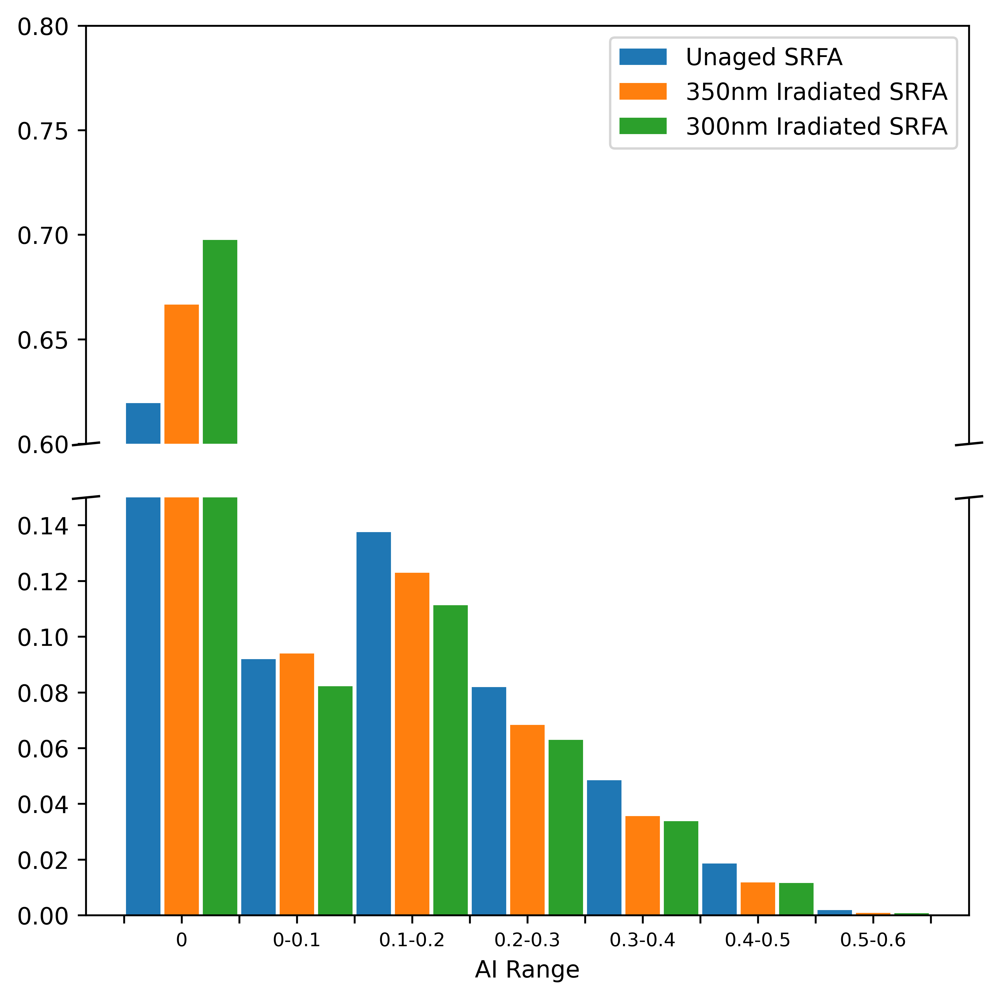

In [17]:
fig, (ax, ax2) = plt.subplots(2, 1, sharex=True, figsize=(6, 6))
#SRFA_list = [SRFA, SRFA_350, SRFA_300]
bins = np.arange(-0.1, 0.7, 0.1)
item =SRFA_list[0]
normalized_abundance = item.groupby(pd.cut(item['AI'], bins=bins)).sum()['abundance'] / item['abundance'].sum()
ax.bar(bins[:-1]-0.1/3,normalized_abundance,width=0.09/3,label='Unaged SRFA')
ax2.bar(bins[:-1]-0.1/3,normalized_abundance,width=0.09/3)

item =SRFA_list[2]
normalized_abundance = item.groupby(pd.cut(item['AI'], bins=bins)).sum()['abundance'] / item['abundance'].sum()
ax.bar(bins[:-1],normalized_abundance,width=0.09/3,label='350nm Iradiated SRFA')
ax2.bar(bins[:-1],normalized_abundance,width=0.09/3)

item =SRFA_list[1]
normalized_abundance = item.groupby(pd.cut(item['AI'], bins=bins)).sum()['abundance'] / item['abundance'].sum()
ax.bar(bins[:-1]+0.1/3,normalized_abundance,width=0.09/3,label='300nm Iradiated SRFA')
ax2.bar(bins[:-1]+0.1/3,normalized_abundance,width=0.09/3)

offset = 0.1/3+0.1/6
label = ['','0','','0-0.1','','0.1-0.2','','0.2-0.3','','0.3-0.4','','0.4-0.5','','0.5-0.6',''] 
ticks = [-0.1-offset, -0.1, 0-offset, 0, 0+offset, 0.1, 0.1+offset, 0.2, 0.2+offset, 0.3, 0.3+offset, 0.4, 0.4+offset, 0.5, 0.5+offset] 
ax.set_xticks(ticks)
ax.set_xticklabels(labels=label)

# Set y-axis limits for both subplots
ax.set_ylim(0.6, 0.8)
ax2.set_ylim(0, 0.15)

# Hide the spines and ticks between subplots
ax.spines['bottom'].set_visible(False)
ax2.spines['top'].set_visible(False)
ax.tick_params(bottom=False)  # Hide bottom ticks on the upper subplot
ax2.tick_params(top=False)    # Hide top ticks on the lower subplot

# Other plot settings
plt.xlabel('AI Range')
#plt.ylabel('Weighted Abundance')
#ax.set_title('AI distribution for Condensed Phase Photolysis Sample')
ax.legend()

# Adding diagonal lines to indicate the break
d = .1  # proportion of vertical to horizontal extent of the slanted line
kwargs = dict(marker=[(-1, -d), (1, d)], markersize=12,
              linestyle="none", color='k', mec='k', mew=1, clip_on=False)
ax.plot([0, 1], [0, 0], transform=ax.transAxes, **kwargs)
ax2.plot([0, 1], [1, 1], transform=ax2.transAxes, **kwargs)
plt.xticks(fontsize=8) 
plt.subplots_adjust(hspace=0.05)
#fig.text(0.065, 0.5, 'Normalized Abundance', va='center', rotation='vertical')
plt.tight_layout()

plt.show()



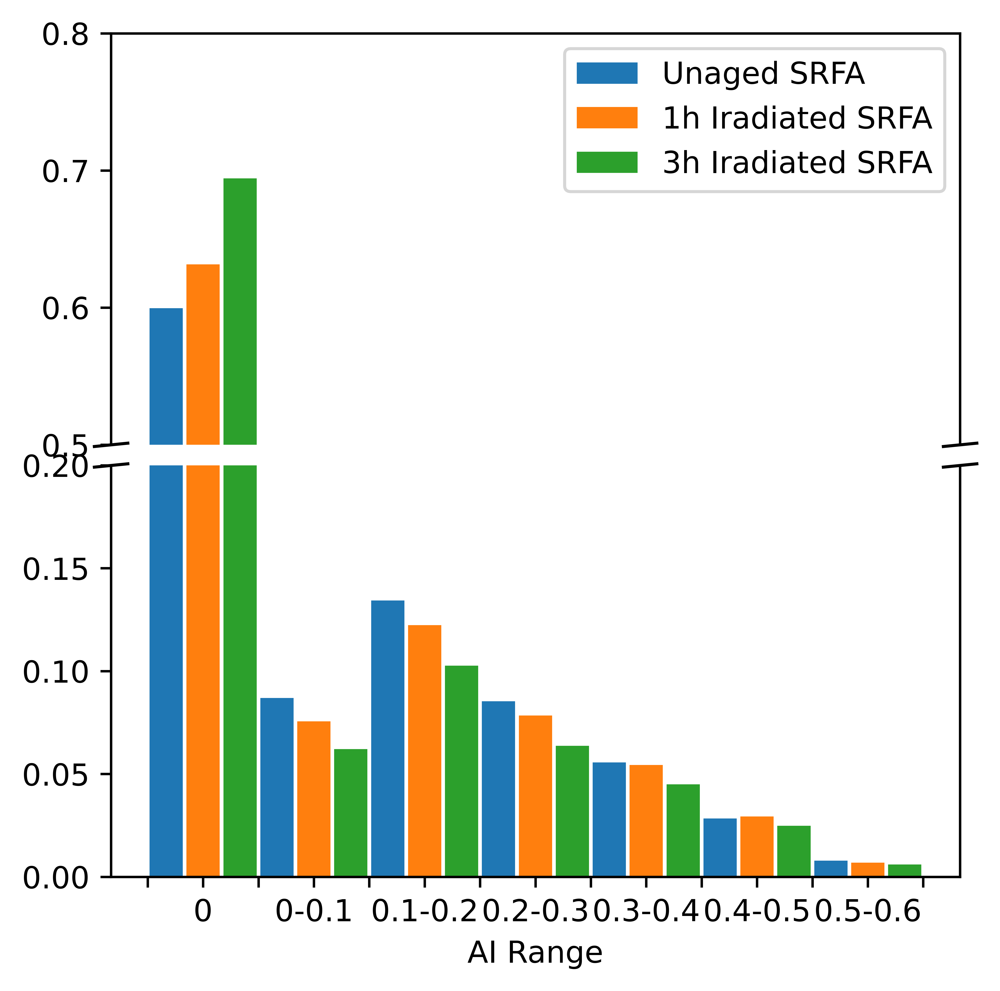

In [ ]:

fig, (ax, ax2) = plt.subplots(2, 1, sharex=True, figsize=(5, 5))
bins = np.arange(-0.1, 0.7, 0.1)
item =SRFA_300_Aqu_list[0]
normalized_abundance = item.groupby(pd.cut(item['AI'], bins=bins)).sum()['abundance'] / item['abundance'].sum()
ax.bar(bins[:-1]-0.1/3,normalized_abundance,width=0.09/3,label='Unaged SRFA')
ax2.bar(bins[:-1]-0.1/3,normalized_abundance,width=0.09/3)

item =SRFA_300_Aqu_list[1]
normalized_abundance = item.groupby(pd.cut(item['AI'], bins=bins)).sum()['abundance'] / item['abundance'].sum()
ax.bar(bins[:-1],normalized_abundance,width=0.09/3,label='1h Iradiated SRFA')
ax2.bar(bins[:-1],normalized_abundance,width=0.09/3)

item =SRFA_300_Aqu_list[2]
normalized_abundance = item.groupby(pd.cut(item['AI'], bins=bins)).sum()['abundance'] / item['abundance'].sum()
ax.bar(bins[:-1]+0.1/3,normalized_abundance,width=0.09/3,label='3h Iradiated SRFA')
ax2.bar(bins[:-1]+0.1/3,normalized_abundance,width=0.09/3)

offset = 0.1/3+0.1/6
label = ['','0','','0-0.1','','0.1-0.2','','0.2-0.3','','0.3-0.4','','0.4-0.5','','0.5-0.6',''] 
ticks = [-0.1-offset, -0.1, 0-offset, 0, 0+offset, 0.1, 0.1+offset, 0.2, 0.2+offset, 0.3, 0.3+offset, 0.4, 0.4+offset, 0.5, 0.5+offset] 
ax.set_xticks(ticks)
ax.set_xticklabels(labels=label)

# Set y-axis limits for both subplots
ax.set_ylim(0.5, 0.8)
ax2.set_ylim(0, 0.2)

# Hide the spines and ticks between subplots
ax.spines['bottom'].set_visible(False)
ax2.spines['top'].set_visible(False)
ax.tick_params(bottom=False)  # Hide bottom ticks on the upper subplot
ax2.tick_params(top=False)    # Hide top ticks on the lower subplot

# Other plot settings
plt.xlabel('AI Range')
#plt.ylabel('Weighted Abundance')
#ax.set_title('AI distribution for Condensed Phase Photolysis Sample')
ax.legend()

# Adding diagonal lines to indicate the break
d = .1  # proportion of vertical to horizontal extent of the slanted line
kwargs = dict(marker=[(-1, -d), (1, d)], markersize=12,
              linestyle="none", color='k', mec='k', mew=1, clip_on=False)
ax.plot([0, 1], [0, 0], transform=ax.transAxes, **kwargs)
ax2.plot([0, 1], [1, 1], transform=ax2.transAxes, **kwargs)

plt.subplots_adjust(hspace=0.05)
#fig.text(0.065, 0.5, 'Normalized Abundance', va='center', rotation='vertical')

plt.show()



In [24]:
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format='retina'

Text(0.4, 0.63, '(b)')

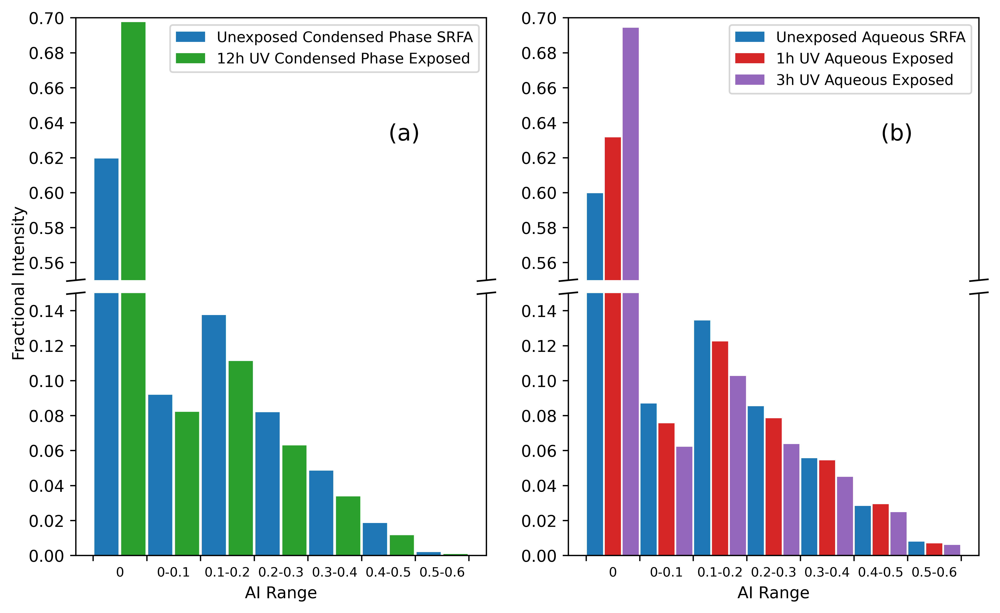

In [26]:
bins = np.arange(-0.1, 0.7, 0.1)
# Create a figure
fig = plt.figure(figsize=(10, 6))

# Create main axes for the top parts
ax = fig.add_subplot(221)
ax2 = fig.add_subplot(222)

offset = 0.1/3+0.1/6
# Create additional axes for the bottom parts
ax_break = fig.add_subplot(223)
ax2_break = fig.add_subplot(224)
default_colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
top_5_colors = default_colors[:5]
item =SRFA_list[0]
normalized_abundance = item.groupby(pd.cut(item['AI'], bins=bins)).sum()['abundance'] / item['abundance'].sum()
ax.bar(bins[:-1]-offset/2,normalized_abundance,width=0.09/2,label='Unexposed Condensed Phase SRFA',color=top_5_colors[0])
ax_break.bar(bins[:-1]-offset/2,normalized_abundance,width=0.09/2,color=top_5_colors[0])

#item =SRFA_list[2]
#normalized_abundance = item.groupby(pd.cut(item['AI'], bins=bins)).sum()['abundance'] / item['abundance'].sum()
#ax.bar(bins[:-1],normalized_abundance,width=0.09/3,label='UVA Condensed Phase Exposed',color=top_5_colors[1])
#ax_break.bar(bins[:-1],normalized_abundance,width=0.09/3,color=top_5_colors[1])

item =SRFA_list[1]
normalized_abundance = item.groupby(pd.cut(item['AI'], bins=bins)).sum()['abundance'] / item['abundance'].sum()
ax.bar(bins[:-1]+offset/2,normalized_abundance,width=0.09/2,label='12h UV Condensed Phase Exposed',color=top_5_colors[2])
ax_break.bar(bins[:-1]+offset/2,normalized_abundance,width=0.09/2,color=top_5_colors[2])

item =SRFA_300_Aqu_list[0]
normalized_abundance = item.groupby(pd.cut(item['AI'], bins=bins)).sum()['abundance'] / item['abundance'].sum()
ax2.bar(bins[:-1]-0.1/3,normalized_abundance,width=0.09/3,label='Unexposed Aqueous SRFA',color=top_5_colors[0])
ax2_break.bar(bins[:-1]-0.1/3,normalized_abundance,width=0.09/3,color=top_5_colors[0])

item =SRFA_300_Aqu_list[1]
normalized_abundance = item.groupby(pd.cut(item['AI'], bins=bins)).sum()['abundance'] / item['abundance'].sum()
ax2.bar(bins[:-1],normalized_abundance,width=0.09/3,label='1h UV Aqueous Exposed',color=top_5_colors[3])
ax2_break.bar(bins[:-1],normalized_abundance,width=0.09/3,color=top_5_colors[3])

item =SRFA_300_Aqu_list[2]
normalized_abundance = item.groupby(pd.cut(item['AI'], bins=bins)).sum()['abundance'] / item['abundance'].sum()
ax2.bar(bins[:-1]+0.1/3,normalized_abundance,width=0.09/3,label='3h UV Aqueous Exposed',color=top_5_colors[4])
ax2_break.bar(bins[:-1]+0.1/3,normalized_abundance,width=0.09/3,color=top_5_colors[4])
ax.set_xticks([])
ax2.set_xticks([])
for axx in [ax, ax2, ax_break, ax2_break]:
    #axx.spines['top'].set_visible(False)
    #axx.spines['right'].set_visible(False)
    axx.xaxis.tick_bottom()
    axx.yaxis.tick_left()


ax.spines['bottom'].set_visible(False)
ax2.spines['bottom'].set_visible(False)
ax_break.spines['top'].set_visible(False)
ax2_break.spines['top'].set_visible(False)

# Set y-axis limits for both subplots
# Example: if you want to break the axis at y=0.3
ax.set_ylim(0.55, 0.7)      # Upper part
ax_break.set_ylim(0, 0.15)  # Lower part
ax2.set_ylim(0.55, 0.7)     # Upper part
ax2_break.set_ylim(0, 0.15) # Lower part

d = .1  # proportion of vertical to horizontal extent of the slanted line
kwargs = dict(marker=[(-1, -d), (1, d)], markersize=12,
              linestyle="none", color='k', mec='k', mew=1, clip_on=False)
ax.plot([0, 1], [0, 0], transform=ax.transAxes, **kwargs)
ax_break.plot([0, 1], [1, 1], transform=ax_break.transAxes, **kwargs)

kwargs = dict(marker=[(-1, -d), (1, d)], markersize=12,
              linestyle="none", color='k', mec='k', mew=1, clip_on=False)
ax2.plot([0, 1], [0, 0], transform=ax2.transAxes, **kwargs)
ax2_break.plot([0, 1], [1, 1], transform=ax2_break.transAxes, **kwargs)
plt.subplots_adjust(hspace=0.05)

#offset = 0.1/3+0.1/6
label = ['','0','','0-0.1','','0.1-0.2','','0.2-0.3','','0.3-0.4','','0.4-0.5','','0.5-0.6',''] 
ticks = [-0.1-offset, -0.1, 0-offset, 0, 0+offset, 0.1, 0.1+offset, 0.2, 0.2+offset, 0.3, 0.3+offset, 0.4, 0.4+offset, 0.5, 0.5+offset] 
ax_break.set_xticks(ticks)
ax_break.set_xticklabels(labels=label,fontsize=8)
ax2_break.set_xticks(ticks)
ax2_break.set_xticklabels(labels=label,fontsize=8)
#ax.set_ylabel('Normalized Abundance')
#ax.set_ylabel('Normalized Abundance')
fig.text(0.07, 0.5, 'Fractional Intensity', va='center', rotation='vertical')
ax_break.set_xlabel('AI Range')
ax2_break.set_xlabel('AI Range')
ax.legend(fontsize=9)
ax2.legend(fontsize=9)


for label, tick in zip(ax_break.get_xticklabels(), ax_break.xaxis.get_major_ticks()):
    if label.get_text() == "":
        pass
        #tick.tick1line.set_visible(False)
        #tick.tick2line.set_visible(False)
    else:
        tick.tick1line.set_visible(False)

        tick.tick2line.set_visible(False)

for label, tick in zip(ax2_break.get_xticklabels(), ax2_break.xaxis.get_major_ticks()):
    if label.get_text() == "":
        pass
        #tick.tick1line.set_visible(False)
        #tick.tick2line.set_visible(False)
    else:
        tick.tick1line.set_visible(False)

        tick.tick2line.set_visible(False)

ax.text(0.4,0.63,'(a)',fontsize=14)
ax2.text(0.4,0.63,'(b)',fontsize=14)


In [30]:
offset

0.05

In [31]:
(-0.1-offset+0-offset_

-0.2

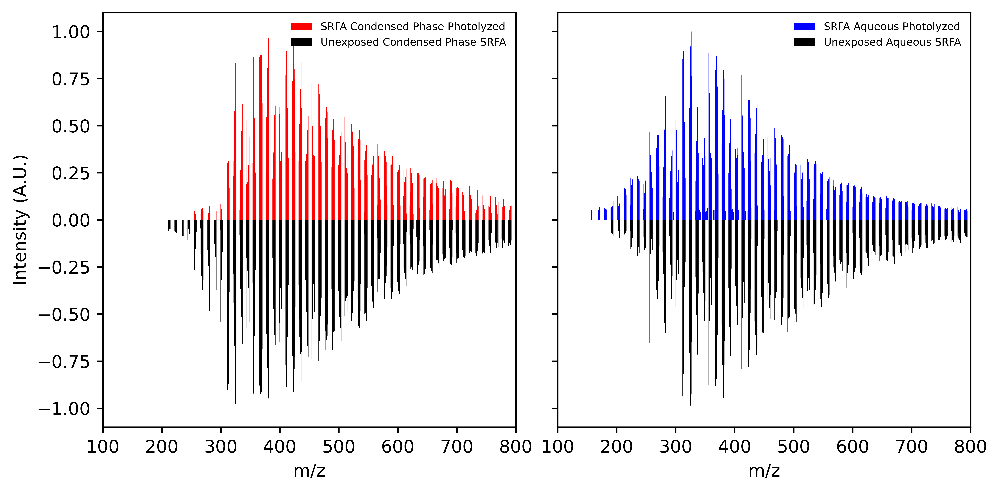

In [55]:
fig, ax = plt.subplots(1, 2, figsize=(8, 4),sharey=True) 
ax[0].bar(SRFA_300['theor_mass'],SRFA_300['abundance']/SRFA_300['abundance'].max(), label='SRFA Condensed Phase Photolyzed',color="red")
ax[0].bar(SRFA['theor_mass'],-SRFA['abundance']/SRFA['abundance'].max(), label='Unexposed Condensed Phase SRFA',color="black")
ax[0].set_ylabel('Intensity (A.U.)')
ax[1].bar(SRFA_300_Aqu_list[2]['theor_mass'], SRFA_300_Aqu_list[2]['abundance']/SRFA_300_Aqu_list[2]['abundance'].max(), label='SRFA Aqueous Photolyzed',color="blue")
ax[1].bar(SRFA_300_Aqu_list[0]['theor_mass'], -SRFA_300_Aqu_list[0]['abundance']/SRFA_300_Aqu_list[0]['abundance'].max(), label='Unexposed Aqueous SRFA',color="black")
for a in ax:
    a.set_xlim((100,800))
    a.set_xlabel('m/z')
    a.legend(frameon=False,fontsize=6) 
plt.tight_layout()

In [396]:
SRFA_300.head()

,Unnamed: 0,exp_mass,abundance,RT,formula,class,group,C,H,O,...,tag,CRAM,NOSC,CAI,DBE_AI,AI,class_kell,class_perm,class_lasz,log10C0
0,1,253.107956,0.033441,24.90,C13H18O5,O5,CHO,13,18,5,...,Unambiguous,True,-0.615385,8,0.0,0.000000,unsat_lowOC,phenylisopropanoids,peptide,1.674757
1,2,255.087306,0.048509,36.99,C12H16O6,O6,CHO,12,16,6,...,Unambiguous,True,-0.333333,6,-1.0,0.000000,unsat_lowOC,hydrolyzable_tanins,undefinded,1.072746
2,3,257.066582,0.029279,21.21,C11H14O7,O7,CHO,11,14,7,...,Unambiguous,False,0.0,4,-2.0,0.000000,unsat_highOC,hydrolyzable_tanins,undefinded,0.297624
3,4,265.071622,0.029123,20.73,C13H14O6,O6,CHO,13,14,6,...,Unambiguous,True,-0.153846,7,1.0,0.142857,unsat_lowOC,phenylisopropanoids,undefinded,0.788646
4,5,265.108019,0.031247,22.38,C14H18O5,O5,CHO,14,18,5,...,Unambiguous,True,-0.571429,9,1.0,0.111111,unsat_lowOC,phenylisopropanoids,lignin,1.340546


In [404]:
SRFA_300_Aqu_list[2]['tag']

0       Unambiguous
1       Unambiguous
2       Unambiguous
3       Unambiguous
4       Unambiguous
           ...     
2183    Unambiguous
2184    Unambiguous
2185    Unambiguous
2186    Unambiguous
2187    Unambiguous
Name: tag, Length: 2188, dtype: object

In [26]:
print(SRFA['exp_mass'].max())
print(SRFA_300['exp_mass'].max())

print(SRFA_300_Aqu_list[0]['exp_mass'].max())
print(SRFA_300_Aqu_list[2]['exp_mass'].max())

799.355323203215
799.246284871066
799.281151837956
799.136772945301


In [ ]:
SRFA_300 = SRFA_300[SRFA_300['exp_mass']]

/opt/homebrew/Caskroom/miniconda/base/envs/py310/lib/python3.10/site-packages/matplotlib/collections.py:963: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


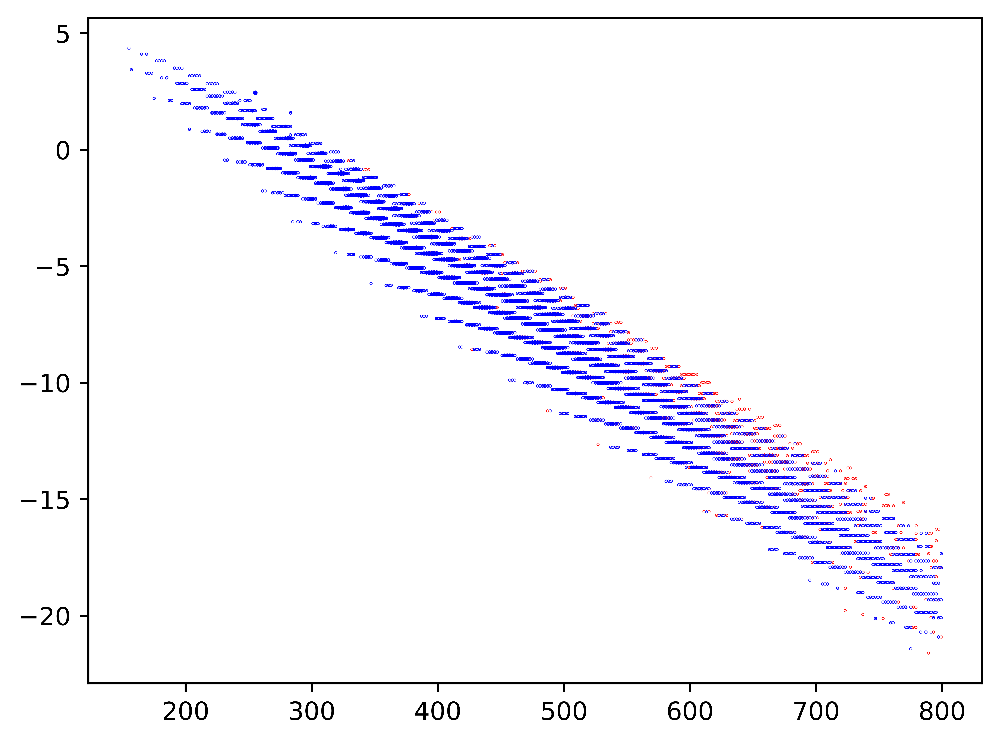

In [412]:
plt.scatter(SRFA_300['theor_mass'],SRFA_300['log10C0'],SRFA_300['abundance']/SRFA_300['abundance'].max(), label='SRFA Photolyzed on Glass',color="red")
plt.scatter(SRFA['theor_mass'],SRFA['log10C0'],-SRFA['abundance']/SRFA['abundance'].max(), label='Unaged SRFA on Glass',color="black")
plt.scatter(SRFA_300_Aqu_list[2]['exp_mass'],SRFA_300_Aqu_list[2]['log10C0'], SRFA_300_Aqu_list[2]['abundance']/SRFA_300_Aqu_list[2]['abundance'].max(), label='SRFA Photolyzed in Water',color="blue")
plt.scatter(SRFA_300_Aqu_list[0]['exp_mass'],SRFA_300_Aqu_list[0]['log10C0'], SRFA_300_Aqu_list[0]['abundance']/SRFA_300_Aqu_list[0]['abundance'].max(), label='SRFA Photolyzed in Water',color="blue")


In [409]:
print(SRFA_300_Aqu_list[2]['abundance'].max())
print(SRFA_300_Aqu_list[2]['abundance'].min())
print(sum(SRFA_300_Aqu_list[2]['abundance'].isna()))



17470742.0
733421.7
0


In [459]:
np.log10(SRFA_300['abundance'])

0      -1.475719
1      -1.314177
2      -1.533451
3      -1.535758
4      -1.505191
          ...   
2079   -0.363007
2080   -0.655640
2081   -0.436568
2082   -0.438854
2083   -0.547377
Name: abundance, Length: 2020, dtype: float64

In [57]:
import matplotlib.colors as mcol
import matplotlib.cm as cm
cm1 = mcol.LinearSegmentedColormap.from_list("MyCmapName",["r","b"])
import matplotlib.colors as colors
from mpl_toolkits.axes_grid1 import make_axes_locatable
# Make a normalizer that will map the time values from
# [start_time,end_time+1] -> [0,1].
#cnorm = mcol.Normalize(vmin=min(0),vmax=max(1))

In [82]:
fig, ax = plt.subplots(2, 2, figsize=(8, 6),sharey=True,sharex=True) 
f_scale = 0.05
ax[0][0].scatter(SRFA_300['theor_mass'],SRFA_300['log10C0'],f_scale*np.log10(SRFA_300['abundance']),c=SRFA_300['O_C'],facecolors='none',cmap='jet')
ax[1][0].scatter(SRFA['theor_mass'],SRFA['log10C0'],f_scale*np.log10(SRFA['abundance']),c=SRFA['O_C'],facecolors='none',cmap='jet')
#ax[0].set_ylabel('Intensity (A.U.)')
ax[0][1].scatter(SRFA_300_Aqu_list[2]['theor_mass'],SRFA_300_Aqu_list[2]['log10C0'], f_scale*np.log10(SRFA_300_Aqu_list[2]['abundance']), label='SRFA Photolyzed in Water',c=SRFA_300_Aqu_list[2]['O_C'],facecolors='none',cmap='jet')
ax[1][1].scatter(SRFA_300_Aqu_list[0]['theor_mass'],SRFA_300_Aqu_list[0]['log10C0'],f_scale*np.log10(SRFA_300_Aqu_list[0]['abundance']), label='Unaged SRFA in Water',c=SRFA_300_Aqu_list[0]['O_C'],facecolors='none',cmap='jet')
#ax[0][0].axhline(y=.5, xmin=0.25, xmax=0.75)
for As in ax:
    for a in As:
        a.axhline(y=1,linestyle='dashed',linewidth=0.5)
        a.set_xlim((100,800))
        #a.legend(loc=0,frameon=True,fontsize=8) 
        a.set_ylim((-25,5))
        #a.set_yticks(list(a.get_yticks()) + [1],list(a.get_yticks().astype(int)) + ["$C_{p}           $"],fontsize=7)
        #print(a.get_yticks())
ax[0][0].text(x=60,y=1,s='$C_{P}$')
ax[1][0].text(x=60,y=1,s='$C_{P}$')

#plt.tight_layout()
#ax[0][0].colorbar(cmap='jet')
#ax[0][0].text(x=450,y=3,s='(a) Condensed Phase Photolyzed SRFA', ha='center',fontsize=8)
ax[0][0].set_title('(a) Condensed Phase Photolyzed SRFA')
ax[1][0].set_title('(c) Unexposed Condensed Phase SRFA')
ax[0][1].set_title('(b) Aqueous Phase Photolyzed SRFA')
ax[1][1].set_title('(d) Unexposed Aqueous Phase SRFA')

#ax[1][0].text(x=450,y=3,s='(c) Unaged Condensed Phase SRFA', ha='center',fontsize=8)
#ax[0][1].text(x=450,y=3,s='(b) Aqueous Phase Photolyzed SRFA', ha='center',fontsize=8)
#ax[1][1].text(x=450,y=3,s='(d) Unaged Aqueous Phase SRFA', ha='center',fontsize=8)
ax[1][1].set_xlabel('M/Z')
ax[1][0].set_xlabel('M/Z')
ax[0][0].set_ylabel('$Log_{10}$($C_{0}/\mu g*m^{-3}$)')
ax[1][0].set_ylabel('$Log_{10}$($C_{0}/\mu g*m^{-3}$)')
'''
divider = make_axes_locatable(ax[0][0])
cax = divider.append_axes("right", size="2%", pad=0.05)
fig.colorbar(sm, cax=cax)
'''
#cbar_ax = fig.add_axes([0.6, 0.8, 0.6, 0.7])  # Example values

# Add the colorbar to the new axes
#fig.colorbar(sm, ax=ax[0][0],orientation='horizontal',shrink=0.5, fraction=0.1,label='O:C')
#fig.colorbar(sm, cax=ax[0][0],orientation='vertical')
left = 1.25/ fig.get_figwidth()
bottom = 3.75 / fig.get_figheight()
width = 0.15  # Adjust as necessary
height = 0.02  # Adjust as necessary
norm = colors.Normalize(vmin=0, vmax=1)
sm = cm.ScalarMappable(norm=norm, cmap='jet')
# Create a new axes for the colorbar
cbar_ax = fig.add_axes([left, bottom, width, height])

# Add the colorbar to the new axes
fig.colorbar(sm, cax=cbar_ax, orientation='horizontal', label='O:C',shrink=0.8)
plt.tight_layout()

ax[0][0].text(480,-5,'  $Fraction < C_{P}$\n     99.96%')
ax[1][0].text(480,-5,'  $Fraction < C_{P}$\n     99.14%')
ax[0][1].text(480,-5,'  $Fraction < C_{P}$\n     95.80%')
ax[1][1].text(480,-5,'  $Fraction < C_{P}$\n     98.14%')



plt.savefig('8.png')

/var/folders/zh/6yg0122j0tlgz3_2t6x64jkh0000gn/T/ipykernel_3089/1241323240.py:56: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


In [83]:
print(SRFA_300[SRFA_300['log10C0']<1]['abundance'].sum()/SRFA_300['abundance'].sum())
print(SRFA[SRFA['log10C0']<1]['abundance'].sum()/SRFA['abundance'].sum())
print(SRFA_300_Aqu_list[2][SRFA_300_Aqu_list[2]['log10C0']<1]['abundance'].sum()/SRFA_300_Aqu_list[2]['abundance'].sum())
print(SRFA_300_Aqu_list[0][SRFA_300_Aqu_list[0]['log10C0']<1]['abundance'].sum()/SRFA_300_Aqu_list[0]['abundance'].sum())


0.9996147552411356
0.9914138261016916
0.958087494541117
0.9813851359963176


In [187]:
fig, axs = plt.subplots(3, 1, figsize=(8, 6))  # 3 rows, 1 column

# First plot
axs[0].bar(SRFA_300_Aqu_list[0]['exp_mass'], SRFA_300_Aqu_list[0]['abundance']/SRFA_300_Aqu_list[0]['abundance'].max(), color='black',label='0h')


# Second plot (replace data with SRFA_300 data)
axs[1].bar(SRFA_300_Aqu_list[1]['exp_mass'], SRFA_300_Aqu_list[1]['abundance']/SRFA_300_Aqu_list[1]['abundance'].max(), color='black',label='1h')

# Third plot (replace data with SRFA_350 data)
axs[2].bar(SRFA_300_Aqu_list[2]['exp_mass'], SRFA_300_Aqu_list[2]['abundance']/SRFA_300_Aqu_list[2]['abundance'].max(), color='black',label='3h')
plt.tight_layout()
i=0
txt_list = ['1) 0h', '2) 1h', '3) 3h']
for a in axs:
    a.set_xlim((100,800))
    #a.set_ylim(0,0.003)
    a.text(750,0.9,txt_list[i])

    i+=1

In [308]:
SRFA_300_Aqu_list = [df_SRFA_Aqu_0h,df_SRFA_Aqu_1h,df_SRFA_Aqu_3h]
SRFA_300_Aqu_un_list = [df_SRFA_Aqu_0h_un,df_SRFA_Aqu_1h_un,df_SRFA_Aqu_3h_un]
fig, ax = plt.subplots(3, 1, figsize=(12, 12),sharex=True) 
for i,a in enumerate(ax):
    df = SRFA_300_Aqu_list[i]
    #df = df[df['l']]
    #df_un = SRFA_300_Aqu_un_list[i]
    df=calculate_indices_bundled_v4(df)
    #df = df[df['DBE']/df['C']>0.5]
    #df = df[(df['theor_mass'] < 300) & (df['theor_mass'] > 200)]
    #df = df[df['theor_mass'] < 800]
    #a.bar(df['theor_mass'],df['abundance'])
    CHO = df[df['group']=='CHO']
    CHNO = df[df['group']=='CHNO']
    CHNOP = df[df['group']=='CHNOP']
    #df = df[df["DBE"]/df['C']>0.67]
    #print(len(df))
    a.bar(df['theor_mass'],df['abundance']/df['abundance'].max())
    #a.bar(df_un['exp_mass'],df_un['abundance'])

    #a.bar(CHO['theor_mass'],CHO['abundance'],color='black')
    #a.bar(CHNOP['theor_mass'],CHNOP['abundance'],color='blue')
    #a.bar(CHNO['theor_mass'],CHNO['abundance'],color='red')


    df_filter = df[df['DBE']/df['C']>0.5]
    print(df_filter['abundance'].sum()/ df['abundance'].sum(),'BrC percentage')
    #print(df[df['theor_mass']>400]['abundance'].sum()/df['abundance'].sum(),'Larger%')
    
    #df = df[df['DBE']/df[]]
    print(len(df))


0.5466051298728452 BrC percentage
2230
0.5080584831309343 BrC percentage
2056
0.4764023511214309 BrC percentage
2188
